In [1]:
from ultralytics import YOLO

# Load the YOLO Pose model
model = YOLO("yolo11n-pose.pt")  # or "yolov8n-pose.pt"

# Run inference on your image (absolute path)
results = model.predict(source=r"C:\Users\malak\Desktop\bodypose_project\images", show=True)

# Print keypoints and bounding boxes
for r in results:
    print("Bounding boxes:", r.boxes.xyxy)
    print("Keypoints:", r.keypoints.xy)



image 1/9 C:\Users\malak\Desktop\bodypose_project\images\1.jpg: 512x640 1 person, 111.2ms
image 2/9 C:\Users\malak\Desktop\bodypose_project\images\10.jpg: 448x640 4 persons, 196.6ms
image 3/9 C:\Users\malak\Desktop\bodypose_project\images\2.jpg: 448x640 12 persons, 168.3ms
image 4/9 C:\Users\malak\Desktop\bodypose_project\images\3.jpg: 640x640 5 persons, 241.0ms
image 5/9 C:\Users\malak\Desktop\bodypose_project\images\4.jpg: 512x640 1 person, 190.4ms
image 6/9 C:\Users\malak\Desktop\bodypose_project\images\6.jpg: 448x640 1 person, 162.8ms
image 7/9 C:\Users\malak\Desktop\bodypose_project\images\7.jpg: 640x448 2 persons, 205.3ms
image 8/9 C:\Users\malak\Desktop\bodypose_project\images\8.jpg: 480x640 3 persons, 202.1ms
image 9/9 C:\Users\malak\Desktop\bodypose_project\images\sample1.jpg: 320x640 8 persons, 190.5ms
Speed: 8.1ms preprocess, 185.4ms inference, 2.1ms postprocess per image at shape (1, 3, 320, 640)
Bounding boxes: tensor([[285.5579, 137.8233, 478.3468, 402.0179]])
Keypoints:


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\1.jpg: 512x640 1 person, 106.7ms
Speed: 2.2ms preprocess, 106.7ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 640)


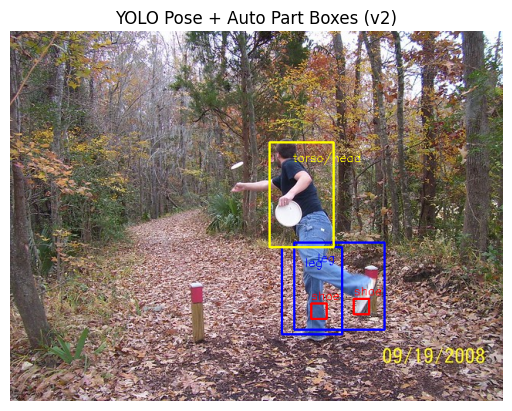


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\10.jpg: 448x640 4 persons, 82.8ms
Speed: 1.8ms preprocess, 82.8ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)


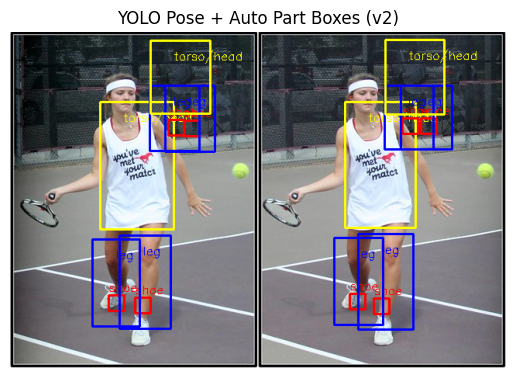


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\2.jpg: 448x640 12 persons, 110.0ms
Speed: 1.7ms preprocess, 110.0ms inference, 4.6ms postprocess per image at shape (1, 3, 448, 640)


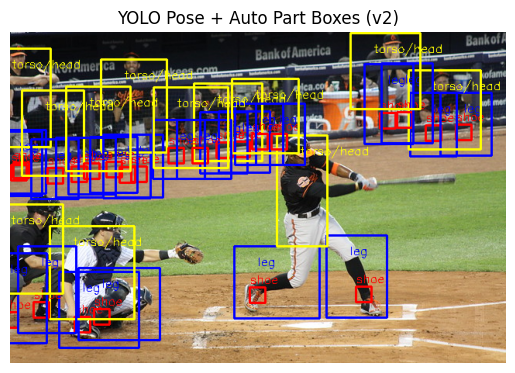


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\3.jpg: 640x640 5 persons, 168.6ms
Speed: 2.5ms preprocess, 168.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


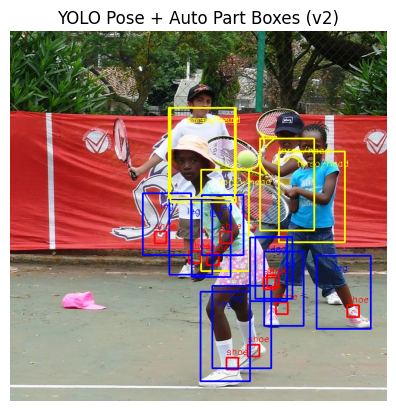


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\4.jpg: 512x640 1 person, 92.2ms
Speed: 1.2ms preprocess, 92.2ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)


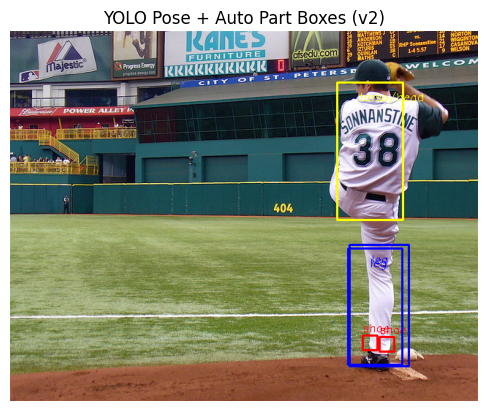


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\6.jpg: 448x640 1 person, 94.8ms
Speed: 2.1ms preprocess, 94.8ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)


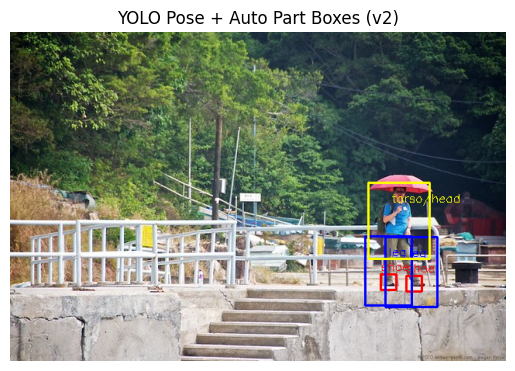


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\7.jpg: 640x448 2 persons, 152.6ms
Speed: 1.3ms preprocess, 152.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 448)


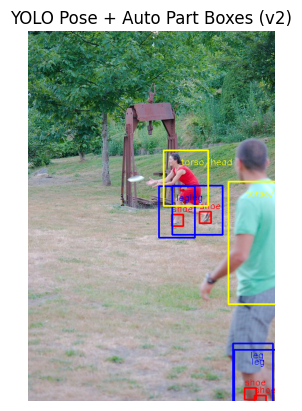


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\8.jpg: 480x640 3 persons, 93.2ms
Speed: 1.7ms preprocess, 93.2ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


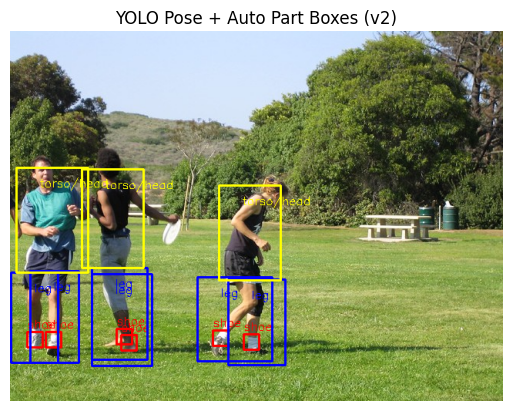


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\sample1.jpg: 320x640 8 persons, 113.7ms
Speed: 1.4ms preprocess, 113.7ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 640)


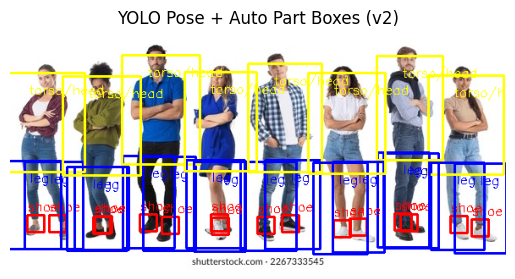

 Done! All results saved in: C:\Users\malak\Desktop\bodypose_project\outputs


In [4]:
from ultralytics import YOLO
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

# -----------------------------
# 1️ Load YOLO Pose model
# -----------------------------
model = YOLO("yolo11n-pose.pt")  # or "yolov8n-pose.pt"

# Folder containing test images
img_folder = r"C:\Users\malak\Desktop\bodypose_project\images"
save_folder = r"C:\Users\malak\Desktop\bodypose_project\outputs"
os.makedirs(save_folder, exist_ok=True)

# -----------------------------
# 2️ Utility: Draw Boxes
# -----------------------------
def draw_part_box(image, pt1, pt2=None, size=10, color=(0, 0, 255), label=None):
    """Draws an expanded bounding box for a part (head, leg, shoe, etc.)."""
    h, w = image.shape[:2]
    if pt2 is None:
        x, y = int(pt1[0]), int(pt1[1])
        cv2.rectangle(image, (x-size, y-size), (x+size, y+size), color, 2)
        if label:
            cv2.putText(image, label, (x-size, y-size-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
    else:
        x1, y1, x2, y2 = int(pt1[0]), int(pt1[1]), int(pt2[0]), int(pt2[1])
        cv2.rectangle(image, (min(x1,x2)-size, min(y1,y2)-size),
                      (max(x1,x2)+size, max(y1,y2)+size), color, 2)
        if label:
            cv2.putText(image, label, (min(x1,x2), min(y1,y2)-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

# -----------------------------
# 3️ Loop through images
# -----------------------------
for img_name in os.listdir(img_folder):
    if not img_name.lower().endswith((".jpg", ".png", ".jpeg")):
        continue

    img_path = os.path.join(img_folder, img_name)
    results = model.predict(source=img_path, show=False)

    for r in results:
        img = cv2.imread(img_path)
        keypoints = r.keypoints.xy  # Shape: (num_people, 17, 2)

        for person in keypoints:
            # Extract keypoints
            nose, l_eye, r_eye, l_ear, r_ear = person[0:5]
            l_shoulder, r_shoulder = person[5], person[6]
            l_hip, r_hip = person[11], person[12]
            l_knee, r_knee = person[13], person[14]
            l_ankle, r_ankle = person[15], person[16]

            # --- Shoe box (±10px around ankle) ---
            draw_part_box(img, l_ankle, size=10, color=(0, 0, 255), label="shoe")
            draw_part_box(img, r_ankle, size=10, color=(0, 0, 255), label="shoe")

            # --- Leg box (±30px between knee and ankle) ---
            draw_part_box(img, l_knee, l_ankle, size=30, color=(255, 0, 0), label="leg")
            draw_part_box(img, r_knee, r_ankle, size=30, color=(255, 0, 0), label="leg")

            # --- Torso/Head box (±30px shoulder-hip range) ---
            draw_part_box(img, l_shoulder, r_hip, size=30, color=(0, 255, 255), label="torso/head")

        # Save image
        save_path = os.path.join(save_folder, f"partbox_{img_name}")
        cv2.imwrite(save_path, img)

        # Show result inline (in Jupyter)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title("YOLO Pose + Auto Part Boxes (v2)")
        plt.axis("off")
        plt.show()

print(" Done! All results saved in:", save_folder)


V2


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\1.jpg: 512x640 1 person, 97.3ms
Speed: 4.2ms preprocess, 97.3ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)


C:\Users\malak\AppData\Local\Temp\ipykernel_21020\2028019784.py:23: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return not (np.isnan(pt[0]) or np.isnan(pt[1]) or pt[0] <= 0 or pt[1] <= 0)


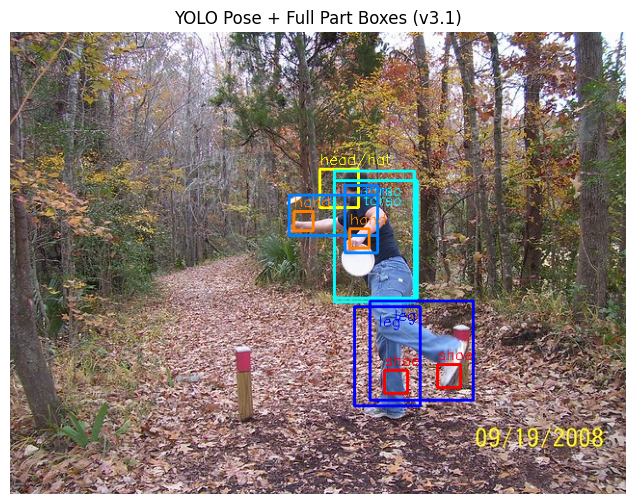


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\10.jpg: 448x640 4 persons, 109.8ms
Speed: 1.4ms preprocess, 109.8ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)


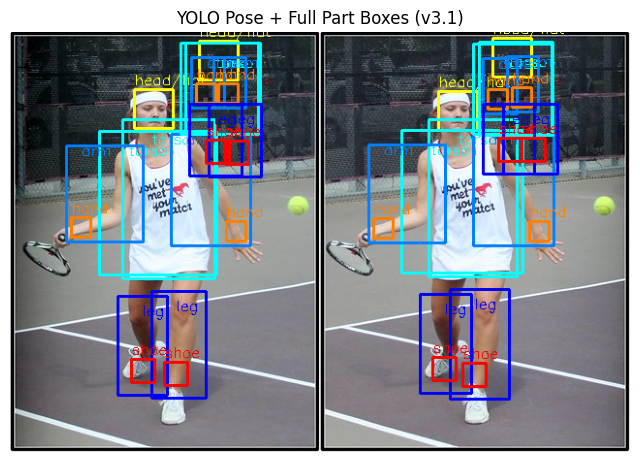


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\2.jpg: 448x640 12 persons, 67.6ms
Speed: 1.1ms preprocess, 67.6ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


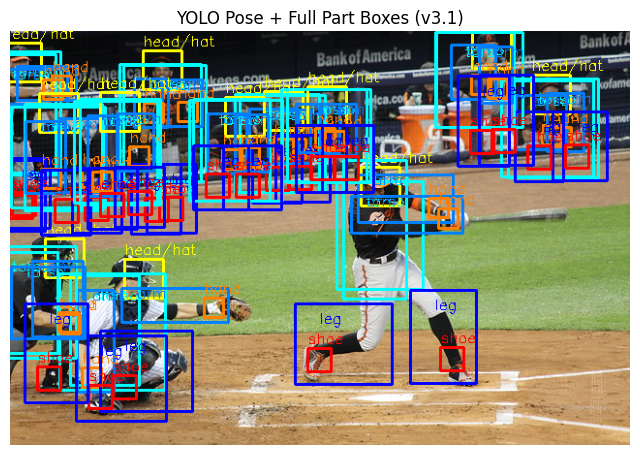


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\3.jpg: 640x640 4 persons, 90.8ms
Speed: 1.9ms preprocess, 90.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


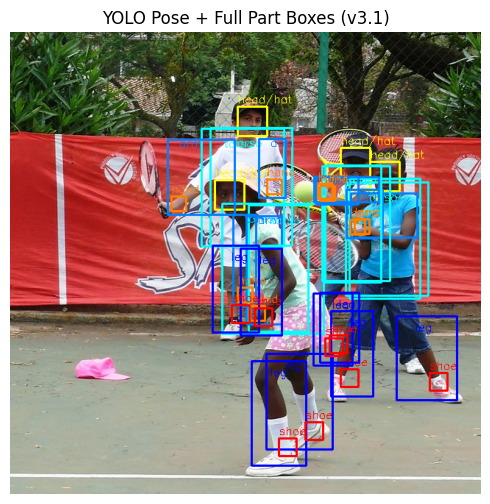


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\4.jpg: 512x640 1 person, 164.1ms
Speed: 1.6ms preprocess, 164.1ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 640)


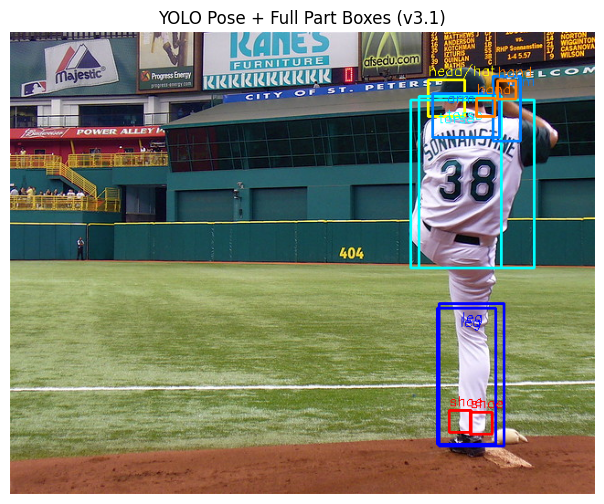


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\6.jpg: 448x640 1 person, 64.9ms
Speed: 0.9ms preprocess, 64.9ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


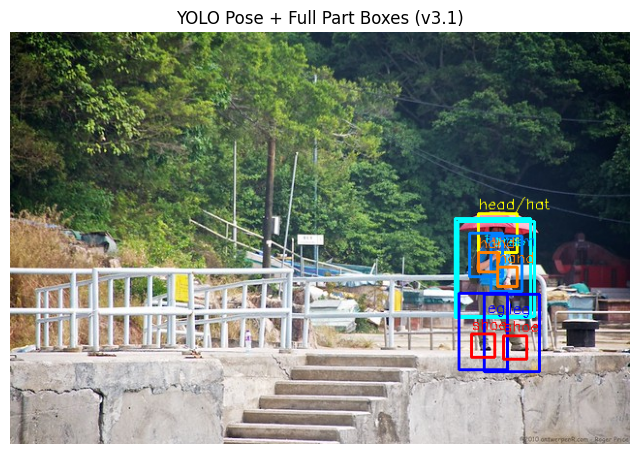


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\7.jpg: 640x448 2 persons, 107.1ms
Speed: 0.9ms preprocess, 107.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 448)


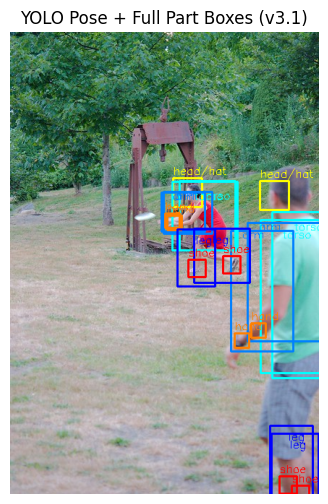


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\8.jpg: 480x640 3 persons, 101.2ms
Speed: 1.1ms preprocess, 101.2ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


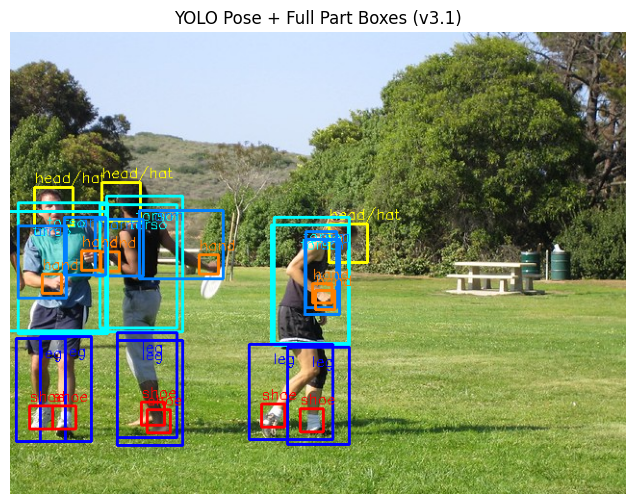


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\sample1.jpg: 320x640 8 persons, 98.6ms
Speed: 1.0ms preprocess, 98.6ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 640)


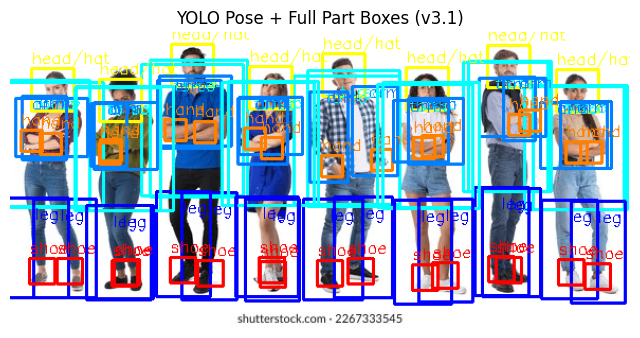

 All images processed and saved to: C:\Users\malak\Desktop\bodypose_project\outputs_v3_1


In [5]:
from ultralytics import YOLO
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

# ================================
# 1️ Load YOLO Pose model
# ================================
model = YOLO("yolo11n-pose.pt")  # or yolov8n-pose.pt

# Input/output folders
img_folder = r"C:\Users\malak\Desktop\bodypose_project\images"
save_folder = r"C:\Users\malak\Desktop\bodypose_project\outputs_v3_1"
os.makedirs(save_folder, exist_ok=True)

# ================================
#  Helper Functions
# ================================

def valid_point(pt):
    """Check if a keypoint is valid (non-NaN and >0)."""
    return not (np.isnan(pt[0]) or np.isnan(pt[1]) or pt[0] <= 0 or pt[1] <= 0)

def draw_box(image, pt1, pt2=None, expand=10, color=(0, 255, 0), label=None):
    """Draws a rectangular part box given 1 or 2 keypoints."""
    if pt1 is None or (pt2 is not None and not valid_point(pt2)):
        return

    h, w = image.shape[:2]
    if pt2 is None:
        x, y = int(pt1[0]), int(pt1[1])
        cv2.rectangle(image, (x - expand, y - expand), (x + expand, y + expand), color, 2)
        if label:
            cv2.putText(image, label, (x - expand, y - expand - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
    else:
        x1, y1, x2, y2 = int(pt1[0]), int(pt1[1]), int(pt2[0]), int(pt2[1])
        cv2.rectangle(image, (min(x1, x2) - expand, min(y1, y2) - expand),
                      (max(x1, x2) + expand, max(y1, y2) + expand), color, 2)
        if label:
            cv2.putText(image, label, (min(x1, x2), min(y1, y2) - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

# ================================
#  Main Loop — Process Images
# ================================

for img_name in os.listdir(img_folder):
    if not img_name.lower().endswith((".jpg", ".png", ".jpeg")):
        continue

    img_path = os.path.join(img_folder, img_name)
    img = cv2.imread(img_path)
    results = model.predict(source=img_path, show=False, conf=0.4)

    for r in results:
        keypoints = r.keypoints.xy  # Shape: (num_people, 17, 2)

        for person in keypoints:
            # Extract COCO keypoints
            nose, l_eye, r_eye, l_ear, r_ear = person[0:5]
            l_shoulder, r_shoulder = person[5], person[6]
            l_elbow, r_elbow = person[7], person[8]
            l_wrist, r_wrist = person[9], person[10]
            l_hip, r_hip = person[11], person[12]
            l_knee, r_knee = person[13], person[14]
            l_ankle, r_ankle = person[15], person[16]

            #  Head / Hat area (±20 px around top of head)
            head_top = np.mean([nose, l_eye, r_eye], axis=0)
            draw_box(img, head_top, expand=20, color=(0, 255, 255), label="head/hat")

            #  Torso (between shoulders and hips ±30 px)
            if valid_point(l_shoulder) and valid_point(r_hip):
                draw_box(img, l_shoulder, r_hip, expand=30, color=(255, 255, 0), label="torso")
            if valid_point(r_shoulder) and valid_point(l_hip):
                draw_box(img, r_shoulder, l_hip, expand=30, color=(255, 255, 0), label="torso")

            #  Arms (shoulder → wrist ±15 px)
            if valid_point(l_shoulder) and valid_point(l_wrist):
                draw_box(img, l_shoulder, l_wrist, expand=15, color=(255, 128, 0), label="arm")
            if valid_point(r_shoulder) and valid_point(r_wrist):
                draw_box(img, r_shoulder, r_wrist, expand=15, color=(255, 128, 0), label="arm")

            #  Hands (±10 px around wrist)
            if valid_point(l_wrist):
                draw_box(img, l_wrist, expand=10, color=(0, 128, 255), label="hand")
            if valid_point(r_wrist):
                draw_box(img, r_wrist, expand=10, color=(0, 128, 255), label="hand")

            #  Legs (knee → ankle ±25 px)
            if valid_point(l_knee) and valid_point(l_ankle):
                draw_box(img, l_knee, l_ankle, expand=25, color=(255, 0, 0), label="leg")
            if valid_point(r_knee) and valid_point(r_ankle):
                draw_box(img, r_knee, r_ankle, expand=25, color=(255, 0, 0), label="leg")

            #  Shoes (±12 px around ankle)
            if valid_point(l_ankle):
                draw_box(img, l_ankle, expand=12, color=(0, 0, 255), label="shoe")
            if valid_point(r_ankle):
                draw_box(img, r_ankle, expand=12, color=(0, 0, 255), label="shoe")

    # Save & show
    save_path = os.path.join(save_folder, f"partbox_{img_name}")
    cv2.imwrite(save_path, img)

    plt.figure(figsize=(8,6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("YOLO Pose + Full Part Boxes (v3.1)")
    plt.axis("off")
    plt.show()

print(" All images processed and saved to:", save_folder)


In [6]:
from ultralytics import YOLO
import cv2
import numpy as np
import os

# ================================
# YOLO Pose + Unified Part Boxes (v3.2)
# ================================

model = YOLO("yolo11n-pose.pt")

# Define paths
img_folder = r"C:\Users\malak\Desktop\bodypose_project\images"
save_img_folder = r"C:\Users\malak\Desktop\bodypose_project\outputs_v3_2\images"
save_label_folder = r"C:\Users\malak\Desktop\bodypose_project\outputs_v3_2\labels"

os.makedirs(save_img_folder, exist_ok=True)
os.makedirs(save_label_folder, exist_ok=True)

# Class mapping for YOLO training
class_map = {
    0: "head",
    1: "torso",
    2: "arm",
    3: "hand",
    4: "leg",
    5: "shoe"
}

# Helper functions
def valid(pt):
    return pt is not None and not np.isnan(pt[0]) and not np.isnan(pt[1]) and pt[0] > 0 and pt[1] > 0

def merge_boxes(b1, b2):
    if b1 is None: return b2
    if b2 is None: return b1
    return [
        min(b1[0], b2[0]),
        min(b1[1], b2[1]),
        max(b1[2], b2[2]),
        max(b1[3], b2[3])
    ]

def make_box(pt1, pt2=None, expand=10):
    if pt1 is None or not valid(pt1):
        return None
    if pt2 is not None and valid(pt2):
        x1, y1 = min(pt1[0], pt2[0]) - expand, min(pt1[1], pt2[1]) - expand
        x2, y2 = max(pt1[0], pt2[0]) + expand, max(pt1[1], pt2[1]) + expand
    else:
        x1, y1, x2, y2 = pt1[0] - expand, pt1[1] - expand, pt1[0] + expand, pt1[1] + expand
    return [x1, y1, x2, y2]

def yolo_line(class_id, box, img_w, img_h):
    x_center = ((box[0] + box[2]) / 2) / img_w
    y_center = ((box[1] + box[3]) / 2) / img_h
    w = (box[2] - box[0]) / img_w
    h = (box[3] - box[1]) / img_h
    return f"{class_id} {x_center:.6f} {y_center:.6f} {w:.6f} {h:.6f}\n"

# ================================
# Process images
# ================================
for img_name in os.listdir(img_folder):
    if not img_name.lower().endswith((".jpg", ".png", ".jpeg")):
        continue

    img_path = os.path.join(img_folder, img_name)
    img = cv2.imread(img_path)
    h, w = img.shape[:2]
    results = model.predict(source=img_path, conf=0.4, show=False)
    yolo_lines = []

    for r in results:
        keypoints = r.keypoints.xy
        for person in keypoints:
            # COCO keypoints
            nose, l_eye, r_eye, l_ear, r_ear = person[0:5]
            l_sh, r_sh = person[5], person[6]
            l_el, r_el = person[7], person[8]
            l_wr, r_wr = person[9], person[10]
            l_hp, r_hp = person[11], person[12]
            l_kn, r_kn = person[13], person[14]
            l_an, r_an = person[15], person[16]

            # Head
            head_box = make_box(nose, None, 20)
            if head_box:
                cv2.rectangle(img, (int(head_box[0]), int(head_box[1])), (int(head_box[2]), int(head_box[3])), (0,255,255), 2)
                cv2.putText(img, "head", (int(head_box[0]), int(head_box[1]-5)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,255), 1)
                yolo_lines.append(yolo_line(0, head_box, w, h))

            # Torso
            torso_box = merge_boxes(make_box(l_sh, l_hp, 30), make_box(r_sh, r_hp, 30))
            if torso_box:
                cv2.rectangle(img, (int(torso_box[0]), int(torso_box[1])), (int(torso_box[2]), int(torso_box[3])), (255,255,0), 2)
                cv2.putText(img, "torso", (int(torso_box[0]), int(torso_box[1]-5)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 1)
                yolo_lines.append(yolo_line(1, torso_box, w, h))

            # Arms
            arm_box = merge_boxes(make_box(l_sh, l_wr, 15), make_box(r_sh, r_wr, 15))
            if arm_box:
                cv2.rectangle(img, (int(arm_box[0]), int(arm_box[1])), (int(arm_box[2]), int(arm_box[3])), (255,128,0), 2)
                cv2.putText(img, "arm", (int(arm_box[0]), int(arm_box[1]-5)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,128,0), 1)
                yolo_lines.append(yolo_line(2, arm_box, w, h))

            # Hands
            hand_box = merge_boxes(make_box(l_wr, None, 10), make_box(r_wr, None, 10))
            if hand_box:
                cv2.rectangle(img, (int(hand_box[0]), int(hand_box[1])), (int(hand_box[2]), int(hand_box[3])), (0,128,255), 2)
                cv2.putText(img, "hand", (int(hand_box[0]), int(hand_box[1]-5)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,128,255), 1)
                yolo_lines.append(yolo_line(3, hand_box, w, h))

            # Legs
            leg_box = merge_boxes(make_box(l_kn, l_an, 25), make_box(r_kn, r_an, 25))
            if leg_box:
                cv2.rectangle(img, (int(leg_box[0]), int(leg_box[1])), (int(leg_box[2]), int(leg_box[3])), (255,0,0), 2)
                cv2.putText(img, "leg", (int(leg_box[0]), int(leg_box[1]-5)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 1)
                yolo_lines.append(yolo_line(4, leg_box, w, h))

            # Shoes
            shoe_box = merge_boxes(make_box(l_an, None, 12), make_box(r_an, None, 12))
            if shoe_box:
                cv2.rectangle(img, (int(shoe_box[0]), int(shoe_box[1])), (int(shoe_box[2]), int(shoe_box[3])), (0,0,255), 2)
                cv2.putText(img, "shoe", (int(shoe_box[0]), int(shoe_box[1]-5)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,0,255), 1)
                yolo_lines.append(yolo_line(5, shoe_box, w, h))

    cv2.imwrite(os.path.join(save_img_folder, img_name), img)
    with open(os.path.join(save_label_folder, img_name.replace(".jpg", ".txt")), "w") as f:
        f.writelines(yolo_lines)

print(" v3.2 completed — images & YOLO labels saved.")



image 1/1 C:\Users\malak\Desktop\bodypose_project\images\1.jpg: 512x640 1 person, 100.6ms
Speed: 3.2ms preprocess, 100.6ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\malak\Desktop\bodypose_project\images\10.jpg: 448x640 4 persons, 96.4ms
Speed: 23.8ms preprocess, 96.4ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)



C:\Users\malak\AppData\Local\Temp\ipykernel_21020\1117427090.py:32: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return pt is not None and not np.isnan(pt[0]) and not np.isnan(pt[1]) and pt[0] > 0 and pt[1] > 0


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\2.jpg: 448x640 12 persons, 73.6ms
Speed: 1.3ms preprocess, 73.6ms inference, 3.7ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\malak\Desktop\bodypose_project\images\3.jpg: 640x640 4 persons, 129.6ms
Speed: 2.2ms preprocess, 129.6ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\malak\Desktop\bodypose_project\images\4.jpg: 512x640 1 person, 95.3ms
Speed: 3.7ms preprocess, 95.3ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\malak\Desktop\bodypose_project\images\6.jpg: 448x640 1 person, 74.2ms
Speed: 1.1ms preprocess, 74.2ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\malak\Desktop\bodypose_project\images\7.jpg: 640x448 2 persons, 81.8ms
Speed: 1.5ms preprocess, 81.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 C:\Users\malak\Desktop\bodypose_project\images\8.

Version v3.3a — Individual Body Parts (left/right separated)


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\1.jpg: 512x640 1 person, 81.5ms
Speed: 2.4ms preprocess, 81.5ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 640)


C:\Users\malak\AppData\Local\Temp\ipykernel_21020\2835420637.py:16: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  def valid(pt): return pt is not None and not np.isnan(pt[0]) and not np.isnan(pt[1]) and pt[0]>0 and pt[1]>0


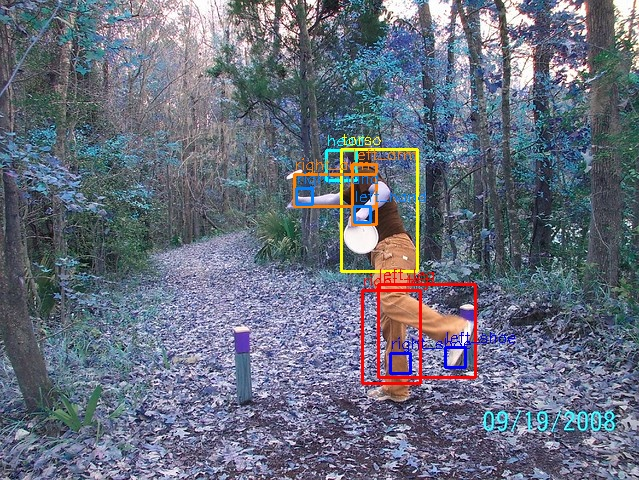


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\10.jpg: 448x640 4 persons, 121.2ms
Speed: 1.2ms preprocess, 121.2ms inference, 2.2ms postprocess per image at shape (1, 3, 448, 640)


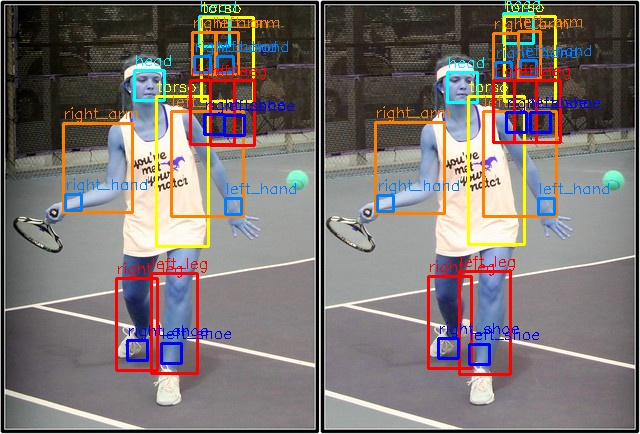


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\2.jpg: 448x640 12 persons, 99.7ms
Speed: 1.0ms preprocess, 99.7ms inference, 3.2ms postprocess per image at shape (1, 3, 448, 640)


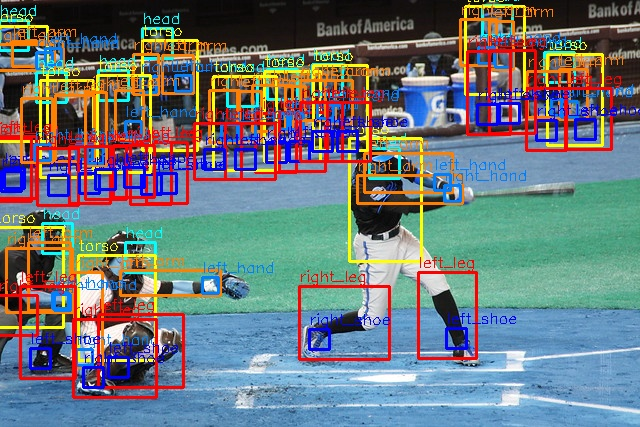


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\3.jpg: 640x640 4 persons, 95.0ms
Speed: 2.1ms preprocess, 95.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


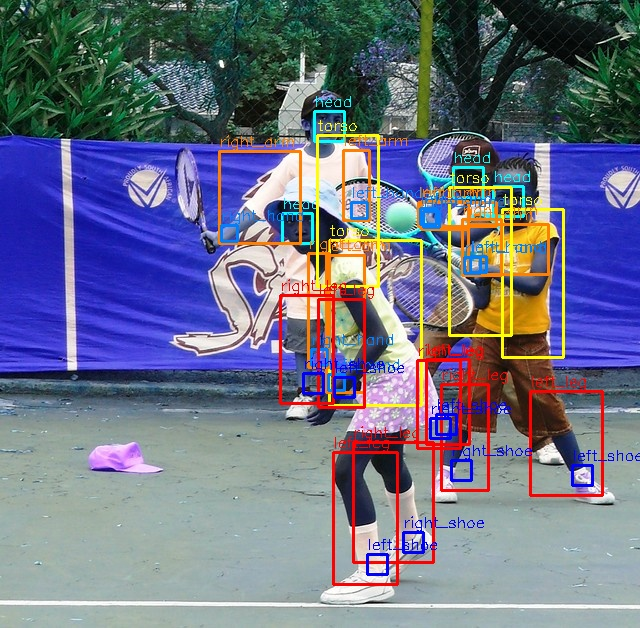


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\4.jpg: 512x640 1 person, 89.1ms
Speed: 1.4ms preprocess, 89.1ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)


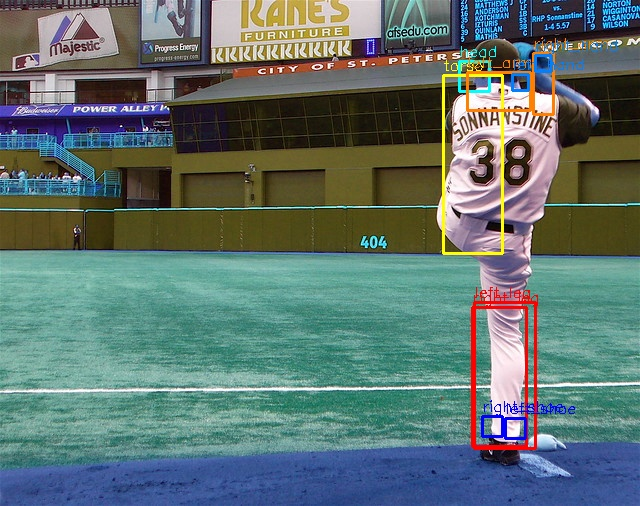


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\6.jpg: 448x640 1 person, 165.9ms
Speed: 1.7ms preprocess, 165.9ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


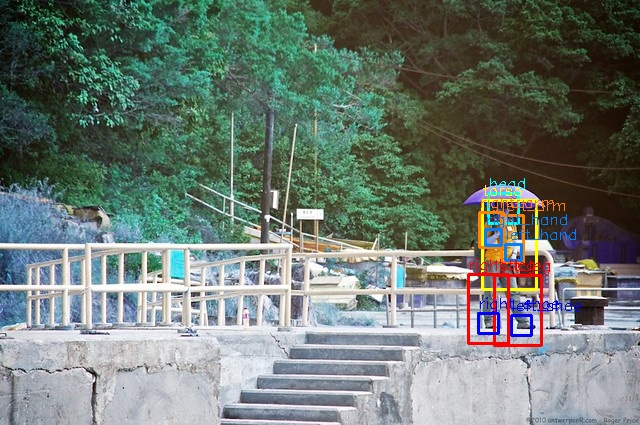


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\7.jpg: 640x448 2 persons, 82.9ms
Speed: 1.0ms preprocess, 82.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 448)


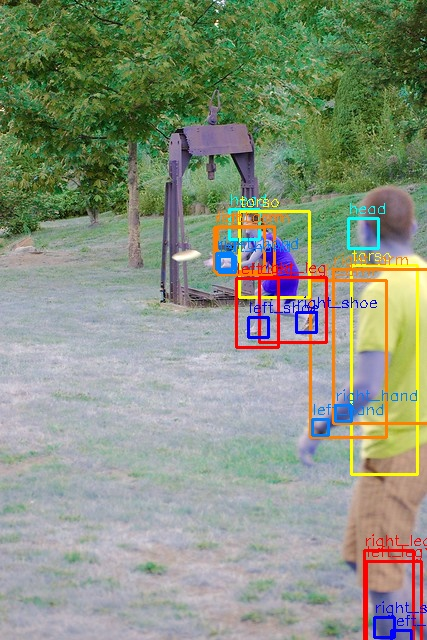


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\8.jpg: 480x640 3 persons, 126.4ms
Speed: 1.7ms preprocess, 126.4ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


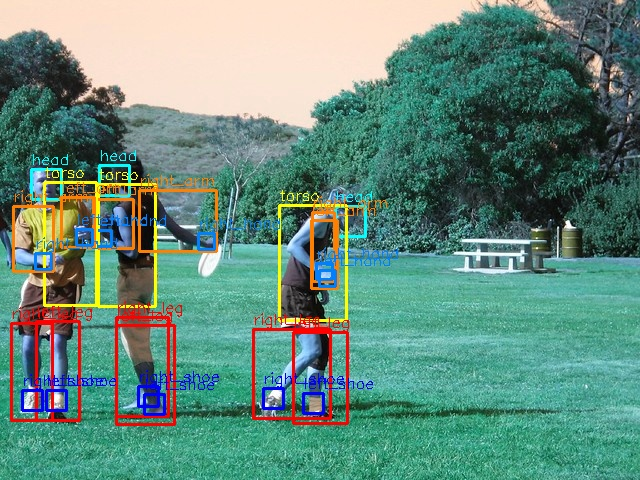


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\sample1.jpg: 320x640 8 persons, 65.6ms
Speed: 1.5ms preprocess, 65.6ms inference, 3.0ms postprocess per image at shape (1, 3, 320, 640)


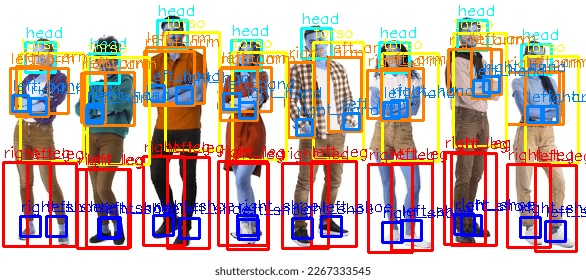

 v3.3a completed - individual parts labeled and previewed.


In [7]:
from ultralytics import YOLO
import cv2, numpy as np, os
from IPython.display import display, Image

model = YOLO("yolo11n-pose.pt")

img_folder = r"C:\Users\malak\Desktop\bodypose_project\images"
save_img_folder = r"C:\Users\malak\Desktop\bodypose_project\outputs_v3_3a\images"
save_label_folder = r"C:\Users\malak\Desktop\bodypose_project\outputs_v3_3a\labels"

os.makedirs(save_img_folder, exist_ok=True)
os.makedirs(save_label_folder, exist_ok=True)

part_classes = ["head","torso","left_arm","right_arm","left_hand","right_hand","left_leg","right_leg","left_shoe","right_shoe"]

def valid(pt): return pt is not None and not np.isnan(pt[0]) and not np.isnan(pt[1]) and pt[0]>0 and pt[1]>0
def make_box(pt1, pt2=None, expand=10):
    if pt1 is None or not valid(pt1): return None
    if pt2 is not None and valid(pt2):
        x1,y1=min(pt1[0],pt2[0])-expand,min(pt1[1],pt2[1])-expand
        x2,y2=max(pt1[0],pt2[0])+expand,max(pt1[1],pt2[1])+expand
    else:
        x1,y1,x2,y2=pt1[0]-expand,pt1[1]-expand,pt1[0]+expand,pt1[1]+expand
    return [x1,y1,x2,y2]

def yolo_line(class_id, box, w, h):
    xc=((box[0]+box[2])/2)/w; yc=((box[1]+box[3])/2)/h
    bw=(box[2]-box[0])/w; bh=(box[3]-box[1])/h
    return f"{class_id} {xc:.6f} {yc:.6f} {bw:.6f} {bh:.6f}\n"

for img_name in os.listdir(img_folder):
    if not img_name.lower().endswith((".jpg",".png",".jpeg")): continue
    path=os.path.join(img_folder,img_name); img=cv2.imread(path)
    h,w=img.shape[:2]; results=model.predict(source=path,conf=0.4,show=False)
    yolo_lines=[]
    for r in results:
        for person in r.keypoints.xy:
            nose,le,re,lear,rear=person[0:5]; lsh,rsh=person[5],person[6]
            lel,rel=person[7],person[8]; lwr,rwr=person[9],person[10]
            lhp,rhp=person[11],person[12]; lkn,rkn=person[13],person[14]
            lan,ran=person[15],person[16]

            head=make_box(nose,None,15)
            torso=make_box(lsh,lhp,25)
            left_arm,right_arm=make_box(lsh,lwr,10),make_box(rsh,rwr,10)
            left_hand,right_hand=make_box(lwr,None,8),make_box(rwr,None,8)
            left_leg,right_leg=make_box(lkn,lan,20),make_box(rkn,ran,20)
            left_shoe,right_shoe=make_box(lan,None,10),make_box(ran,None,10)
            parts=[head,torso,left_arm,right_arm,left_hand,right_hand,left_leg,right_leg,left_shoe,right_shoe]

            colors=[(0,255,255),(255,255,0),(255,128,0),(255,128,0),(0,128,255),(0,128,255),(255,0,0),(255,0,0),(0,0,255),(0,0,255)]
            for i,box in enumerate(parts):
                if box is None: continue
                cv2.rectangle(img,(int(box[0]),int(box[1])),(int(box[2]),int(box[3])),colors[i],2)
                cv2.putText(img,part_classes[i],(int(box[0]),int(box[1]-5)),cv2.FONT_HERSHEY_SIMPLEX,0.5,colors[i],1)
                yolo_lines.append(yolo_line(i,box,w,h))

    cv2.imwrite(os.path.join(save_img_folder,img_name),img)
    with open(os.path.join(save_label_folder,img_name.replace('.jpg','.txt')),'w') as f: f.writelines(yolo_lines)

    # Preview
    img_rgb=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    cv2.imwrite("preview.jpg",img_rgb)
    display(Image(filename="preview.jpg"))

print(" v3.3a completed - individual parts labeled and previewed.")


Version v3.3b — Merged Parts


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\1.jpg: 512x640 1 person, 89.4ms
Speed: 2.1ms preprocess, 89.4ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 640)


C:\Users\malak\AppData\Local\Temp\ipykernel_21020\934959361.py:16: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  def valid(pt): return pt is not None and not np.isnan(pt[0]) and not np.isnan(pt[1]) and pt[0]>0 and pt[1]>0


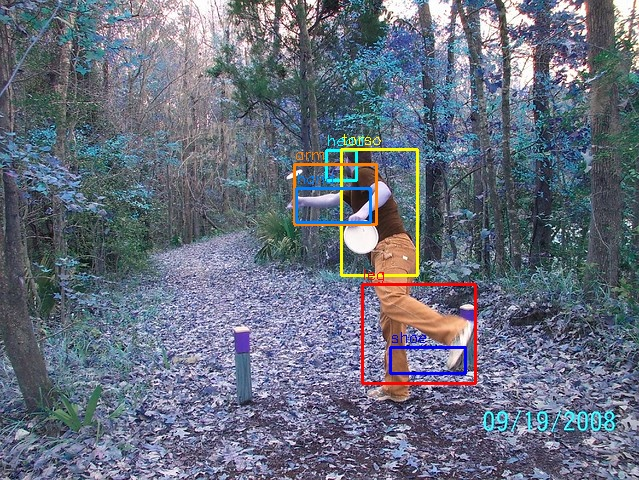


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\10.jpg: 448x640 4 persons, 108.3ms
Speed: 1.8ms preprocess, 108.3ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


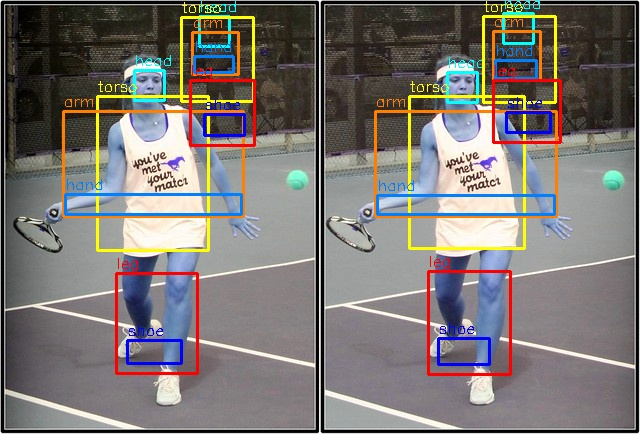


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\2.jpg: 448x640 12 persons, 137.7ms
Speed: 0.9ms preprocess, 137.7ms inference, 2.5ms postprocess per image at shape (1, 3, 448, 640)


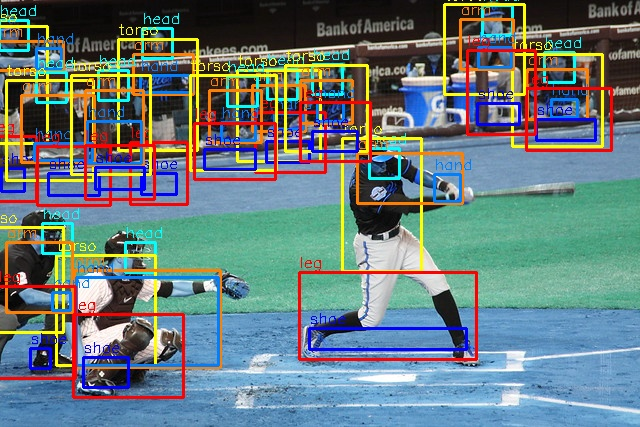


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\3.jpg: 640x640 4 persons, 92.7ms
Speed: 2.6ms preprocess, 92.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


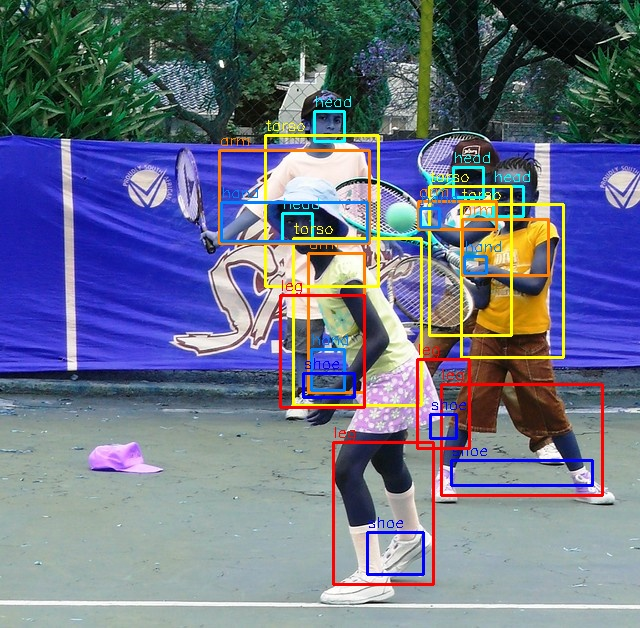


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\4.jpg: 512x640 1 person, 85.8ms
Speed: 1.3ms preprocess, 85.8ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)


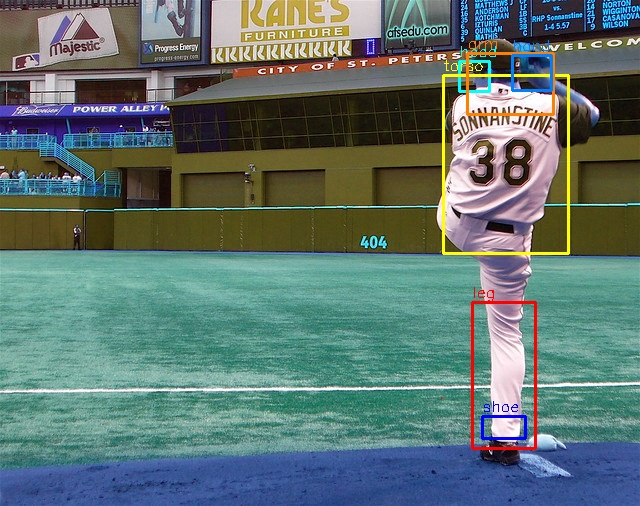


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\6.jpg: 448x640 1 person, 68.9ms
Speed: 0.9ms preprocess, 68.9ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


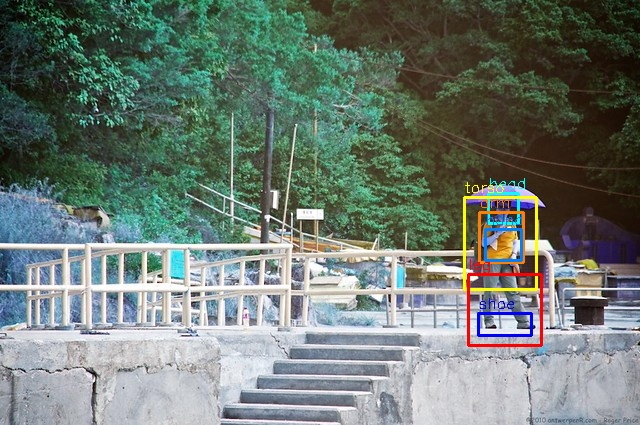


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\7.jpg: 640x448 2 persons, 127.2ms
Speed: 1.5ms preprocess, 127.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 448)


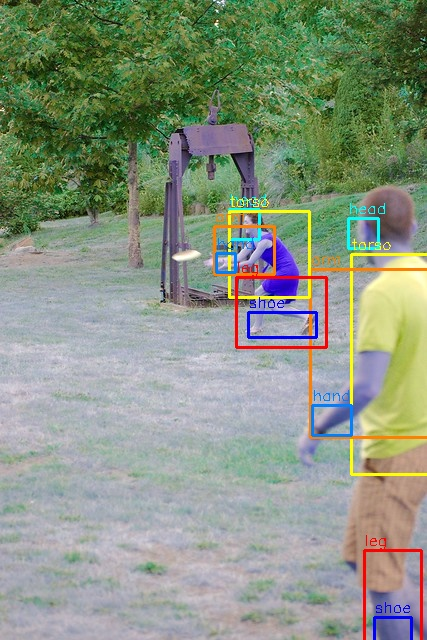


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\8.jpg: 480x640 3 persons, 104.3ms
Speed: 1.7ms preprocess, 104.3ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


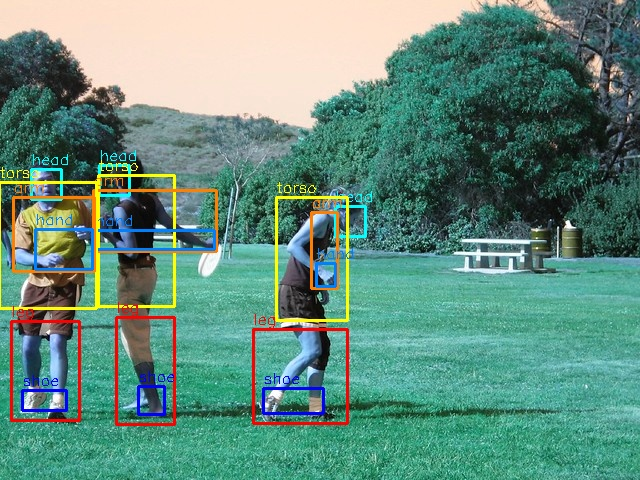


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\sample1.jpg: 320x640 8 persons, 67.2ms
Speed: 1.5ms preprocess, 67.2ms inference, 2.6ms postprocess per image at shape (1, 3, 320, 640)


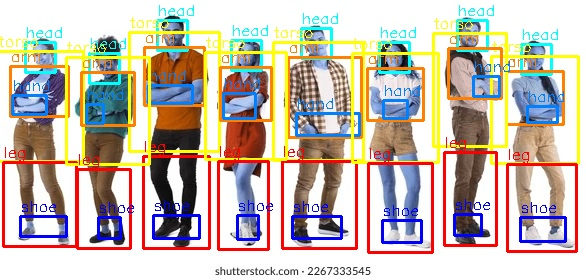

 v3.3b completed - merged parts labeled and previewed.


In [8]:
from ultralytics import YOLO
import cv2, numpy as np, os
from IPython.display import display, Image

model = YOLO("yolo11n-pose.pt")

img_folder = r"C:\Users\malak\Desktop\bodypose_project\images"
save_img_folder = r"C:\Users\malak\Desktop\bodypose_project\outputs_v3_3b\images"
save_label_folder = r"C:\Users\malak\Desktop\bodypose_project\outputs_v3_3b\labels"

os.makedirs(save_img_folder, exist_ok=True)
os.makedirs(save_label_folder, exist_ok=True)

class_map=["head","torso","arm","hand","leg","shoe"]

def valid(pt): return pt is not None and not np.isnan(pt[0]) and not np.isnan(pt[1]) and pt[0]>0 and pt[1]>0
def make_box(pt1,pt2=None,expand=10):
    if pt1 is None or not valid(pt1): return None
    if pt2 is not None and valid(pt2):
        x1,y1=min(pt1[0],pt2[0])-expand,min(pt1[1],pt2[1])-expand
        x2,y2=max(pt1[0],pt2[0])+expand,max(pt1[1],pt2[1])+expand
    else:
        x1,y1,x2,y2=pt1[0]-expand,pt1[1]-expand,pt1[0]+expand,pt1[1]+expand
    return [x1,y1,x2,y2]

def merge_boxes(b1,b2):
    if b1 is None: return b2
    if b2 is None: return b1
    return [min(b1[0],b2[0]),min(b1[1],b2[1]),max(b1[2],b2[2]),max(b1[3],b2[3])]

def yolo_line(i,box,w,h):
    xc=((box[0]+box[2])/2)/w; yc=((box[1]+box[3])/2)/h
    bw=(box[2]-box[0])/w; bh=(box[3]-box[1])/h
    return f"{i} {xc:.6f} {yc:.6f} {bw:.6f} {bh:.6f}\n"

for img_name in os.listdir(img_folder):
    if not img_name.lower().endswith((".jpg",".png",".jpeg")): continue
    path=os.path.join(img_folder,img_name); img=cv2.imread(path)
    h,w=img.shape[:2]; results=model.predict(source=path,conf=0.4,show=False)
    yolo_lines=[]
    for r in results:
        for person in r.keypoints.xy:
            nose,le,re,lear,rear=person[0:5]; lsh,rsh=person[5],person[6]
            lel,rel=person[7],person[8]; lwr,rwr=person[9],person[10]
            lhp,rhp=person[11],person[12]; lkn,rkn=person[13],person[14]
            lan,ran=person[15],person[16]
            head=make_box(nose,None,15)
            torso=merge_boxes(make_box(lsh,lhp,25),make_box(rsh,rhp,25))
            arm=merge_boxes(make_box(lsh,lwr,10),make_box(rsh,rwr,10))
            hand=merge_boxes(make_box(lwr,None,8),make_box(rwr,None,8))
            leg=merge_boxes(make_box(lkn,lan,20),make_box(rkn,ran,20))
            shoe=merge_boxes(make_box(lan,None,10),make_box(ran,None,10))
            boxes=[head,torso,arm,hand,leg,shoe]
            colors=[(0,255,255),(255,255,0),(255,128,0),(0,128,255),(255,0,0),(0,0,255)]
            for i,box in enumerate(boxes):
                if box is None: continue
                cv2.rectangle(img,(int(box[0]),int(box[1])),(int(box[2]),int(box[3])),colors[i],2)
                cv2.putText(img,class_map[i],(int(box[0]),int(box[1]-5)),cv2.FONT_HERSHEY_SIMPLEX,0.5,colors[i],1)
                yolo_lines.append(yolo_line(i,box,w,h))
    cv2.imwrite(os.path.join(save_img_folder,img_name),img)
    with open(os.path.join(save_label_folder,img_name.replace('.jpg','.txt')),'w') as f: f.writelines(yolo_lines)
    img_rgb=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    cv2.imwrite("preview.jpg",img_rgb)
    display(Image(filename="preview.jpg"))

print(" v3.3b completed - merged parts labeled and previewed.")


YOLO Pose v3.4b – Dynamic Scaling + Overlap Fix


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\1.jpg: 512x640 1 person, 90.0ms
Speed: 3.3ms preprocess, 90.0ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)


C:\Users\malak\AppData\Local\Temp\ipykernel_21020\485388187.py:35: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return pt is not None and not np.isnan(pt[0]) and not np.isnan(pt[1]) and pt[0] > 0 and pt[1] > 0


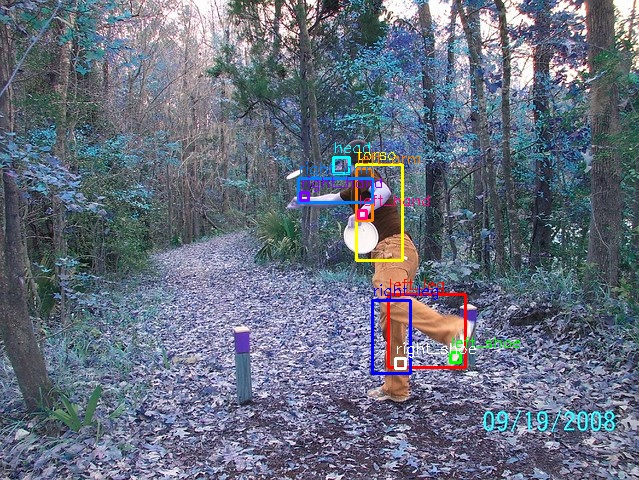


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\10.jpg: 448x640 4 persons, 94.3ms
Speed: 1.1ms preprocess, 94.3ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)


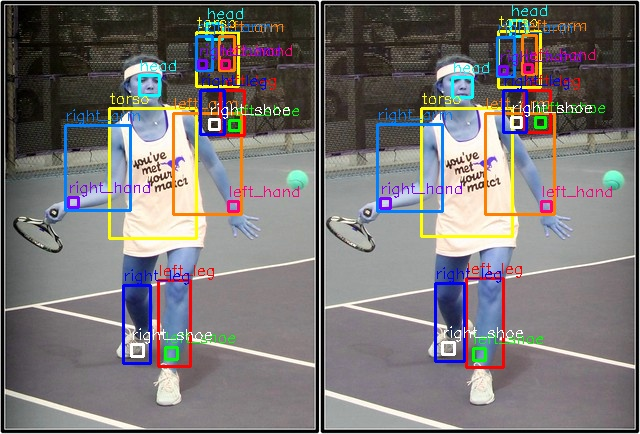


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\2.jpg: 448x640 12 persons, 84.5ms
Speed: 1.3ms preprocess, 84.5ms inference, 3.4ms postprocess per image at shape (1, 3, 448, 640)


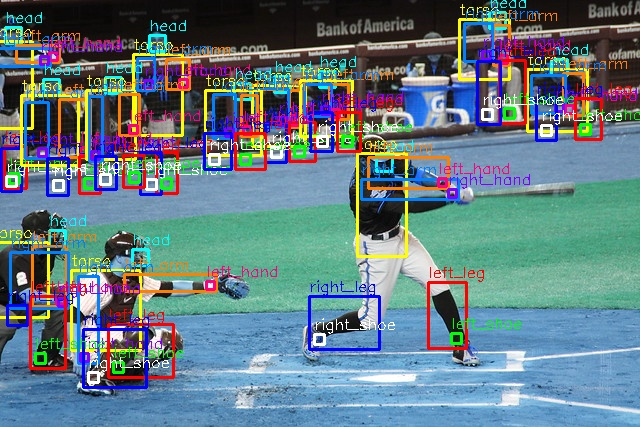


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\3.jpg: 640x640 4 persons, 149.4ms
Speed: 2.4ms preprocess, 149.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


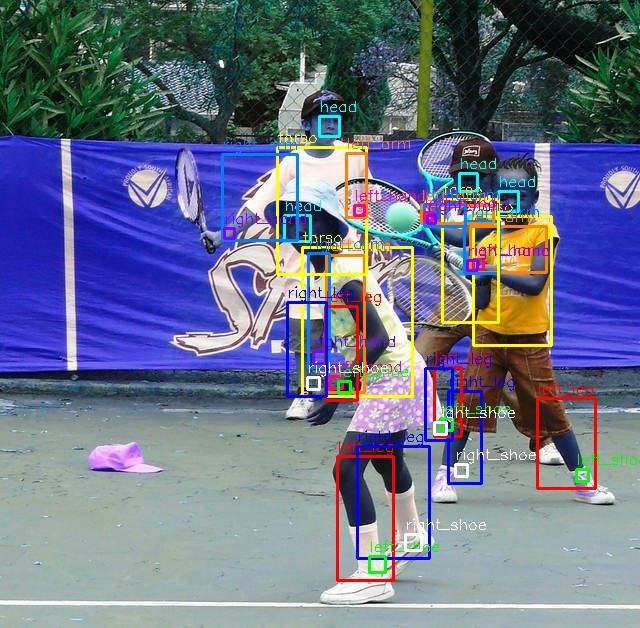


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\4.jpg: 512x640 1 person, 84.8ms
Speed: 1.4ms preprocess, 84.8ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)


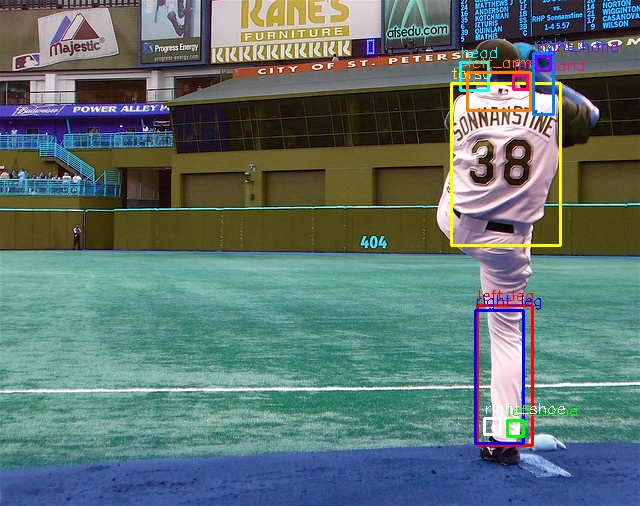


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\6.jpg: 448x640 1 person, 94.0ms
Speed: 1.3ms preprocess, 94.0ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


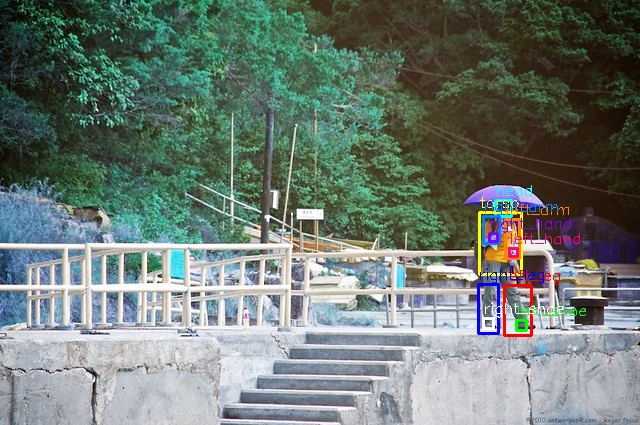


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\7.jpg: 640x448 2 persons, 78.5ms
Speed: 1.7ms preprocess, 78.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 448)


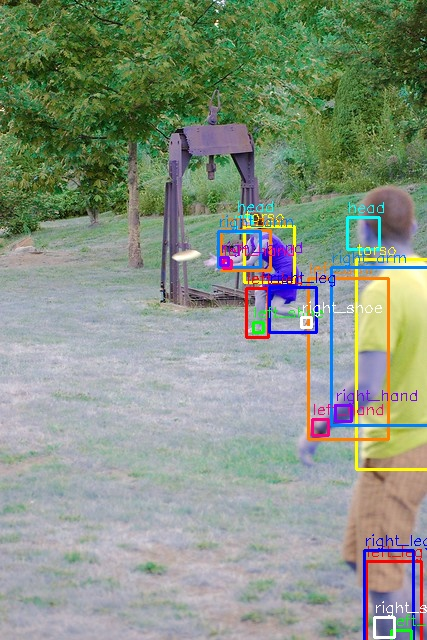


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\8.jpg: 480x640 3 persons, 153.3ms
Speed: 1.9ms preprocess, 153.3ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)


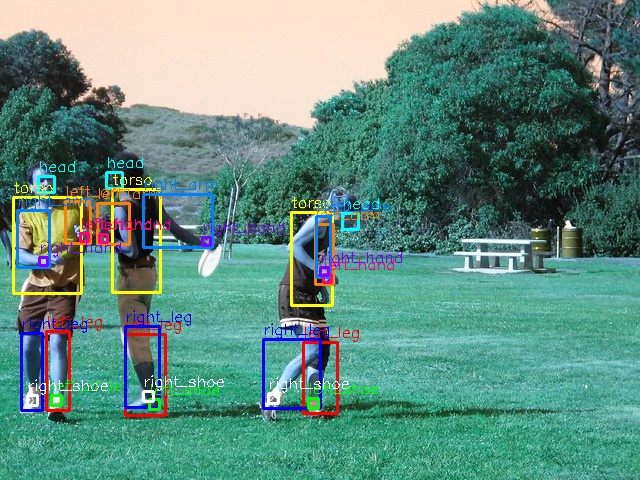


image 1/1 C:\Users\malak\Desktop\bodypose_project\images\sample1.jpg: 320x640 8 persons, 72.9ms
Speed: 2.5ms preprocess, 72.9ms inference, 2.3ms postprocess per image at shape (1, 3, 320, 640)


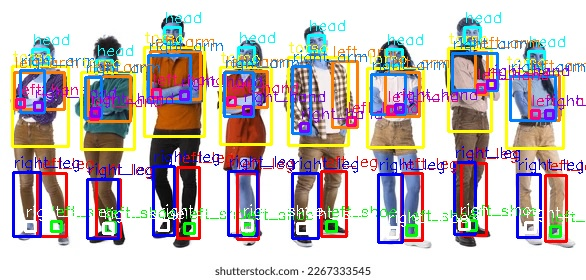

 v3.4b completed — dynamic scaling, overlap fix, improved left/right labeling.


In [11]:
from ultralytics import YOLO
import cv2, numpy as np, os
from IPython.display import display, Image

# Load YOLOv11 Pose model
model = YOLO("yolo11n-pose.pt")

# Paths
img_folder = r"C:\Users\malak\Desktop\bodypose_project\images"
save_img_folder = r"C:\Users\malak\Desktop\bodypose_project\outputs_v3_4b\images"
save_label_folder = r"C:\Users\malak\Desktop\bodypose_project\outputs_v3_4b\labels"

os.makedirs(save_img_folder, exist_ok=True)
os.makedirs(save_label_folder, exist_ok=True)

# Class map
class_map = [
    "head", "torso",
    "left_arm", "right_arm",
    "left_hand", "right_hand",
    "left_leg", "right_leg",
    "left_shoe", "right_shoe"
]

# Colors for visualization
colors = [
    (0,255,255), (255,255,0),
    (255,128,0), (0,128,255),
    (255,0,128), (128,0,255),
    (255,0,0), (0,0,255),
    (0,255,0), (255,255,255)
]

def valid(pt):
    return pt is not None and not np.isnan(pt[0]) and not np.isnan(pt[1]) and pt[0] > 0 and pt[1] > 0

def make_box(pt1, pt2=None, expand=10):
    """Create a bounding box between one or two points."""
    if pt1 is None or not valid(pt1): return None
    if pt2 is not None and valid(pt2):
        x1, y1 = min(pt1[0], pt2[0]) - expand, min(pt1[1], pt2[1]) - expand
        x2, y2 = max(pt1[0], pt2[0]) + expand, max(pt1[1], pt2[1]) + expand
    else:
        x1, y1, x2, y2 = pt1[0] - expand, pt1[1] - expand, pt1[0] + expand, pt1[1] + expand
    return [x1, y1, x2, y2]

def merge_boxes(b1, b2):
    if b1 is None: return b2
    if b2 is None: return b1
    return [min(b1[0],b2[0]), min(b1[1],b2[1]), max(b1[2],b2[2]), max(b1[3],b2[3])]

def yolo_line(i, box, w, h):
    xc = ((box[0] + box[2]) / 2) / w
    yc = ((box[1] + box[3]) / 2) / h
    bw = (box[2] - box[0]) / w
    bh = (box[3] - box[1]) / h
    return f"{i} {xc:.6f} {yc:.6f} {bw:.6f} {bh:.6f}\n"

for img_name in os.listdir(img_folder):
    if not img_name.lower().endswith((".jpg",".png",".jpeg")): continue
    path = os.path.join(img_folder, img_name)
    img = cv2.imread(path)
    h, w = img.shape[:2]

    results = model.predict(source=path, conf=0.4, show=False)
    yolo_lines = []

    for r in results:
        for person, confs in zip(r.keypoints.xy, r.keypoints.conf):
            if confs.mean() < 0.3:
                continue

            # Extract points
            nose, leye, reye, le, re = person[0:5]
            lsh, rsh = person[5], person[6]
            lel, rel = person[7], person[8]
            lwr, rwr = person[9], person[10]
            lhp, rhp = person[11], person[12]
            lkn, rkn = person[13], person[14]
            lan, ran = person[15], person[16]

            # Dynamic scale factor based on height
            body_height = abs(max(lan[1], ran[1]) - min(nose[1], lsh[1])) if valid(nose) and valid(lan) else 100
            scale = max(10, body_height * 0.05)

            # Build boxes
            head = make_box(nose, None, int(scale * 0.8))
            torso = merge_boxes(make_box(lsh, lhp, int(scale)), make_box(rsh, rhp, int(scale)))

            left_arm = make_box(lsh, lwr, int(scale * 0.6))
            right_arm = make_box(rsh, rwr, int(scale * 0.6))

            left_hand = make_box(lwr, None, int(scale * 0.4))
            right_hand = make_box(rwr, None, int(scale * 0.4))

            left_leg = make_box(lkn, lan, int(scale))
            right_leg = make_box(rkn, ran, int(scale))

            left_shoe = make_box(lan, None, int(scale * 0.5))
            right_shoe = make_box(ran, None, int(scale * 0.5))

            boxes = [head, torso, left_arm, right_arm, left_hand, right_hand,
                     left_leg, right_leg, left_shoe, right_shoe]

            # Draw boxes
            for i, box in enumerate(boxes):
                if box is None: continue
                cv2.rectangle(img, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), colors[i], 2)
                cv2.putText(img, class_map[i], (int(box[0]), int(box[1]) - 5),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, colors[i], 1)
                yolo_lines.append(yolo_line(i, box, w, h))

            # Optional segmentation overlay
            if hasattr(r, 'masks') and r.masks is not None:
                for seg in r.masks.xy:
                    cv2.polylines(img, [np.int32(seg)], True, (0,255,0), 1)

    # Save outputs
    cv2.imwrite(os.path.join(save_img_folder, img_name), img)
    with open(os.path.join(save_label_folder, img_name.replace('.jpg','.txt')), 'w') as f:
        f.writelines(yolo_lines)

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cv2.imwrite("preview.jpg", img_rgb)
    display(Image(filename="preview.jpg"))

print(" v3.4b completed — dynamic scaling, overlap fix, improved left/right labeling.")
